In [1]:
import visual_behavior_glm.src.GLM_params as glm_params
import visual_behavior_glm.src.GLM_analysis_tools as gat
from visual_behavior_glm.src.glm import GLM
import matplotlib.pyplot as plt
import visual_behavior.data_access.loading as loading
import visual_behavior.database as db
import plotly.express as px

import pandas as pd
import numpy as np
import os

import seaborn as sns

/home/dougo/Code/AllenSDK/allensdk/brain_observatory/behavior/behavior_ophys_api/behavior_ophys_nwb_api.py:9: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


In [2]:
%matplotlib notebook
%widescreen

In [3]:
results_all = gat.retrieve_results(results_type='full')

In [4]:
rs = gat.retrieve_results(search_dict = {'glm_version': '4_L2_optimize_by_cell'}, results_type='summary')
rs

,_id,index,dropout,variance_explained,fraction_change_from_full,absolute_change_from_full,cell_specimen_id,ophys_experiment_id,ophys_session_id,behavior_session_id,container_id,project_code,container_workflow_state,experiment_workflow_state,session_name,session_type,equipment_name,date_of_acquisition,isi_experiment_id,specimen_id,sex,age_in_days,full_genotype,reporter_line,driver_line,imaging_depth,targeted_structure,published_at,super_container_id,cre_line,session_tags,failure_tags,exposure_number,model_outputs_available,location,glm_version,entry_time_utc
0,5f22221a7eeb3a3cbb69c983,0,Full,0.229436,0.000000,0.000000,1017215561,991852008,991639544,991662910,1018028067,VisualBehaviorMultiscope,holding,passed,20191202_479839_6imagesB,OPHYS_6_images_B,MESO.1,2019-12-02 08:27:10.948347,934105391,920877188,M,171.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",377,VISl,NaN,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.596382
1,5f22221a7eeb3a3cbb69c984,1,intercept,0.229937,0.002183,0.000501,1017215561,991852008,991639544,991662910,1018028067,VisualBehaviorMultiscope,holding,passed,20191202_479839_6imagesB,OPHYS_6_images_B,MESO.1,2019-12-02 08:27:10.948347,934105391,920877188,M,171.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",377,VISl,NaN,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.598786
2,5f22221a7eeb3a3cbb69c985,2,time,0.229769,0.001453,0.000333,1017215561,991852008,991639544,991662910,1018028067,VisualBehaviorMultiscope,holding,passed,20191202_479839_6imagesB,OPHYS_6_images_B,MESO.1,2019-12-02 08:27:10.948347,934105391,920877188,M,171.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",377,VISl,NaN,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.600893
3,5f22221a7eeb3a3cbb69c986,3,pre_licks,0.229634,0.000864,0.000198,1017215561,991852008,991639544,991662910,1018028067,VisualBehaviorMultiscope,holding,passed,20191202_479839_6imagesB,OPHYS_6_images_B,MESO.1,2019-12-02 08:27:10.948347,934105391,920877188,M,171.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",377,VISl,NaN,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.603036
4,5f22221a7eeb3a3cbb69c987,4,post_licks,0.227139,-0.010010,-0.002297,1017215561,991852008,991639544,991662910,1018028067,VisualBehaviorMultiscope,holding,passed,20191202_479839_6imagesB,OPHYS_6_images_B,MESO.1,2019-12-02 08:27:10.948347,934105391,920877188,M,171.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",377,VISl,NaN,920877188,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISl_377,4_L2_optimize_by_cell,2020-07-31 17:58:07.605159
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365755,5f24621b2ac3d684bf7369e9,27,model_omissions1,0.048034,0.048249,0.002211,962642740,808621034,808340530,808432167,803589437,VisualBehavior,container_qc,passed,20180114_425496_4_imagesB,OPHYS_4_images_B,CAM2P.4,2019-01-14 20:40:17.000000,781470340,772622653,M,111.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL-GCaMP6f)'],"['Camk2a-tTA', 'Slc17a7-IRES2-Cre']",175,VISp,NaN,772622653,Slc17a7-IRES2-Cre,NaN,NaN,0,1,Slc17a7_VISp_175,4_L2_optimize_by_cell,2020-07-31 18:25:31.153505
1365756,5f24621b2ac3d684bf7369ea,28,model_timing1D,0.048441,0.057133,0.002618,962642740,808621034,808340530,808432167,803589437,VisualBehavior,container_qc,passed,20180114_425496_4_imagesB,OPHYS_4_images_B,CAM2P.4,2019-01-14 20:40:17.000000,781470340,772622653,M,111.0,Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-G...,['Ai93(TITL

In [5]:
rs['identifier'] = rs['ophys_experiment_id'].astype(str) + '_' +  rs['cell_specimen_id'].astype(str)

In [6]:
cutoff = 0.01
cells_to_keep = rs.query('dropout == "Full" and variance_explained >= @cutoff')['identifier'].unique()

In [7]:
rsp = rs.query('identifier in @cells_to_keep').pivot(index='identifier',columns='dropout',values='fraction_change_from_full').reset_index()
rsp

dropout,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,image2,image3,image4,image5,image6,image7,image_expectation,intercept,misses,model_bias,model_omissions1,model_task0,model_timing1D,omissions,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,pupil,rewards,running,time,visual
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,0.002692,0.001819,0.003621,-0.001186,-0.026248,0.002645,0.000947,0.000913,-0.001280,-0.001924,0.000501,-0.000538,0.000135,0.008544,0.007587,-0.005937,0.011424,0.014952,-0.074100,0.010710,-0.020992,-0.001004,-0.228425
1,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,-0.007203,-0.007210,0.002283,-0.018611,0.002152,0.002657,0.000976,0.000081,0.006030,0.000728,0.001277,0.000856,0.002049,0.020436,0.001011,0.003103,0.031004,0.037226,0.005513,0.032333,-0.002625,0.000434,-0.252412
2,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,-0.015761,0.000383,0.000302,-0.012279,0.008475,0.001058,-0.001232,-0.002156,0.000572,0.010619,0.029392,-0.001927,0.021750,-0.000316,-0.004966,0.002149,0.003036,0.008150,-0.057209,-0.000740,0.014037,0.004291,-0.319959
3,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,0.000206,-0.049498,0.001615,-0.021775,0.000046,0.002221,-0.003134,0.003374,0.002284,0.014580,0.006673,0.005393,-0.001058,0.002760,-0.001018,0.000574,0.004443,0.004108,0.005936,0.011120,0.001867,0.002495,-0.435852
4,1000743008_1003146190,0.0,-0.089674,0.000823,0.000713,0.027508,0.019429,0.006967,0.006088,0.004045,-0.003198,-0.024926,0.003739,0.002454,-0.000550,0.008610,0.001467,0.000038,0.000181,-0.000054,0.001188,0.000657,-0.001699,0.031173,0.010330,0.005812,0.031873,0.030949,-0.019613,0.021468,0.005709,0.000490,-0.184349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26790,995439942_994309997,0.0,-0.673633,0.086221,0.006062,0.071843,0.050225,0.058348,-0.005161,0.010604,0.016987,0.005398,0.010657,0.016359,-0.052912,-0.017866,0.012319,-0.013133,0.032441,-0.187010,-0.042443,0.019241,0.004689,0.164390,0.022004,0.012142,0.100268,0.170683,-0.033002,0.096974,0.003498,0.028642,-0.599882
26791,995439942_994310000,0.0,-0.485011,0.007001,0.004174,0.067006,0.025908,0.024597,0.014368,0.014290,-0.012931,0.007199,0.001583,0.006884,-0.065082,0.001343,0.007638,-0.000912,0.030111,0.004711,-0.006249,0.001660,0.005738,0.106612,0.027403,0.043114,0.107631,0.157746,-0.034934,0.070162,0.002936,-0.020402,-0.542672
26792,995439942_994310003,0.0,-1.118526,0.042506,0.000775,0.003791,0.001357,0.004339,0.000590,-0.000652,-0.001458,-0.001410,-0.000970,-0.000321,-0.008589,-0.000520,-0.000430,-0.006349,0.001093,0.000506,-0.102949,-0.001359,0.021117,0.004121,0.005182,-0.001993,0.002772,0.005179,-0.003617,0.017730,0.001021,-0.057415,-1.165996
26793,995439942_994310018,0.0,-0.541743,0.006398,0.003886,0.040050,0.036957,0.039209,0.019981,-0.008514,0.007828,0.020179,-0.061918,0.016950,0.010580,0.016852,0.011578,-0.000300,0.020430,0.004984,-0.013852,-0.001372,0.002127,0.094648,0.015220,0.040880,0.117245,0.166319,0.013375,0.064248,0.013400,-0.003067,-0.598106


In [8]:
rspm = rsp.merge(rs[['identifier','cre_line','cell_specimen_id','session_type','equipment_name']].drop_duplicates(),left_on='identifier',right_on='identifier',how='left')

def map_session_types(session_type):
    session_id = session_type[6:7]
    return session_id
rspm['session_id'] = rspm['session_type'].map(lambda st:map_session_types(st))

rspm

,identifier,Full,all-images,beh_model,change,correct_rejects,false_alarms,hits,image0,image1,image2,image3,image4,image5,image6,image7,image_expectation,intercept,misses,model_bias,model_omissions1,model_task0,model_timing1D,omissions,post_lick_bouts,post_licks,pre_lick_bouts,pre_licks,pupil,rewards,running,time,visual,cre_line,cell_specimen_id,session_type,equipment_name,session_id
0,1000743008_1003146172,0.0,-0.140223,-0.001848,0.000581,0.014875,0.008197,0.005280,-0.000634,0.003108,0.002692,0.001819,0.003621,-0.001186,-0.026248,0.002645,0.000947,0.000913,-0.001280,-0.001924,0.000501,-0.000538,0.000135,0.008544,0.007587,-0.005937,0.011424,0.014952,-0.074100,0.010710,-0.020992,-0.001004,-0.228425,Sst-IRES-Cre,1003146172,OPHYS_1_images_B,CAM2P.3,1
1,1000743008_1003146180,0.0,-0.155019,0.004636,0.000530,0.020636,0.011811,0.003584,0.002961,0.003979,-0.007203,-0.007210,0.002283,-0.018611,0.002152,0.002657,0.000976,0.000081,0.006030,0.000728,0.001277,0.000856,0.002049,0.020436,0.001011,0.003103,0.031004,0.037226,0.005513,0.032333,-0.002625,0.000434,-0.252412,Sst-IRES-Cre,1003146180,OPHYS_1_images_B,CAM2P.3,1
2,1000743008_1003146183,0.0,-0.210215,0.062499,0.000224,0.002435,0.001871,0.001834,0.001881,0.002758,-0.015761,0.000383,0.000302,-0.012279,0.008475,0.001058,-0.001232,-0.002156,0.000572,0.010619,0.029392,-0.001927,0.021750,-0.000316,-0.004966,0.002149,0.003036,0.008150,-0.057209,-0.000740,0.014037,0.004291,-0.319959,Sst-IRES-Cre,1003146183,OPHYS_1_images_B,CAM2P.3,1
3,1000743008_1003146186,0.0,-0.368535,0.021722,0.000232,0.002308,0.006869,0.002990,-0.001212,-0.003161,0.000206,-0.049498,0.001615,-0.021775,0.000046,0.002221,-0.003134,0.003374,0.002284,0.014580,0.006673,0.005393,-0.001058,0.002760,-0.001018,0.000574,0.004443,0.004108,0.005936,0.011120,0.001867,0.002495,-0.435852,Sst-IRES-Cre,1003146186,OPHYS_1_images_B,CAM2P.3,1
4,1000743008_1003146190,0.0,-0.089674,0.000823,0.000713,0.027508,0.019429,0.006967,0.006088,0.004045,-0.003198,-0.024926,0.003739,0.002454,-0.000550,0.008610,0.001467,0.000038,0.000181,-0.000054,0.001188,0.000657,-0.001699,0.031173,0.010330,0.005812,0.031873,0.030949,-0.019613,0.021468,0.005709,0.000490,-0.184349,Sst-IRES-Cre,1003146190,OPHYS_1_images_B,CAM2P.3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26790,995439942_994309997,0.0,-0.673633,0.086221,0.006062,0.071843,0.050225,0.058348,-0.005161,0.010604,0.016987,0.005398,0.010657,0.016359,-0.052912,-0.017866,0.012319,-0.013133,0.032441,-0.187010,-0.042443,0.019241,0.004689,0.164390,0.022004,0.012142,0.100268,0.170683,-0.033002,0.096974,0.003498,0.028642,-0.599882,Sst-IRES-Cre,994309997,OPHYS_6_images_A,CAM2P.4,6
26791,995439942_994310000,0.0,-0.485011,0.007001,0.004174,0.067006,0.025908,0.024597,0.014368,0.014290,-0.012931,0.007199,0.001583,0.006884,-0.065082,0.001343,0.007638,-0.000912,0.030111,0.004711,-0.006249,0.001660,0.005738,0.106612,0.027403,0.043114,0.107631,0.157746,-0.034934,0.070162,0.002936,-0.020402,-0.542672,Sst-IRES-Cre,994310000,OPHYS_6_images_A,CAM2P.4,6
26792,995439942_994310003,0.0,-1.118526,0.042506,0.000775,0.003791,0.001357,0.004339,0.000590,-0.000652,-0.001458,-0.001410,-0.000970,-0.000321,-0.008589,-0.000520,-0.000430,-0.006349,0.001093,0.000506,-0.102949,-0.001359,0.021117,0.004121,0.005182,-0.001993,0.002772,0.005179,-0.003617,0.017730,0.001021,-0.057415,-1.165996,Sst-IRES-Cre,994310003,OPHYS_6_images_A,CAM2P.4,6
26793,995439942_994310018,0.0,-0.541743,0.006398,0.003886,0.040050,0.036957,0.039209,0.019981,-0.008514,0.007828,0.020179,-0.061918,0.016950,0.010580,0.016852,0.011578,-0.000300,0.020430,0.004984,-0.013852,-0.001372,0.002127,0.094648,0.015220,0.040880,0.117245,0.166319,0.013375,0.064248,0.013400,-0.003067,-0.598106,Sst-IRES-Cre,994310018,OPHYS_6_images_A,CAM2P.4,6


In [9]:
cols_for_clustering = [col for col in rspm.columns if col not in ['visual','identifier','cre_line','session_type','equipment_name', 'session_id', 'cell_specimen_id']]
cols_for_clustering

['Full',
 'all-images',
 'beh_model',
 'change',
 'correct_rejects',
 'false_alarms',
 'hits',
 'image0',
 'image1',
 'image2',
 'image3',
 'image4',
 'image5',
 'image6',
 'image7',
 'image_expectation',
 'intercept',
 'misses',
 'model_bias',
 'model_omissions1',
 'model_task0',
 'model_timing1D',
 'omissions',
 'post_lick_bouts',
 'post_licks',
 'pre_lick_bouts',
 'pre_licks',
 'pupil',
 'rewards',
 'running',
 'time']

In [10]:
sorted_cols = rspm[cols_for_clustering].median(axis=0).sort_values().index

In [11]:
rspm.set_index('identifier')[sorted_cols].sort_values(by=['all-images','running'])

,all-images,running,pupil,Full,image4,change,image7,image0,image5,post_licks,image3,intercept,image6,image1,image2,time,image_expectation,post_lick_bouts,model_omissions1,model_task0,model_timing1D,model_bias,misses,hits,false_alarms,beh_model,rewards,correct_rejects,omissions,pre_lick_bouts,pre_licks
identifier,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
846487947_961985164,-13.206204,1.216737,-0.480915,0.0,-0.041766,0.042602,0.040312,0.018240,-0.329811,0.067418,0.076178,-0.018807,0.023480,0.043971,0.063961,0.429513,0.018810,0.041542,-0.906916,0.841591,1.209437,0.448413,0.091614,0.212713,-6.956264e-02,4.158633,0.298459,0.107721,0.889603,0.399347,0.310444
822647135_962554101,-10.171026,0.101770,-0.003982,0.0,0.026690,0.000789,0.049128,0.041075,0.061628,0.050831,0.040118,0.036485,0.024198,0.037167,-0.105839,-0.611550,0.019462,0.001391,0.422561,-0.069404,0.564696,-0.444482,0.013807,0.031603,2.113624e-02,0.467337,0.066238,0.066719,0.086079,0.215007,0.030721
848694639_962574986,-9.040117,-0.014500,-3.010270,0.0,-0.004812,0.003548,0.059354,0.053438,-0.050740,0.015879,-0.175339,1.006192,0.017608,0.037880,-0.043053,1.647520,0.046154,0.035147,0.485614,1.224292,-2.492414,4.701558,-0.017253,0.071047,3.044027e-01,4.340093,-0.340138,0.056789,0.225729,0.485361,0.175745
974384470_1007092516,-8.912741,-0.452497,0.261638,0.0,0.033379,0.000678,0.000846,-0.152486,0.034992,0.003034,0.088963,0.002936,0.023562,0.001872,0.047357,0.197254,0.016605,0.000395,0.768416,0.110406,0.933084,0.319788,0.022961,-0.000217,1.663266e-02,2.050450,0.040283,0.045957,-0.089244,0.037111,-0.109552
826585773_961885003,-8.606362,0.084364,-0.153492,0.0,-0.353953,0.002084,-0.018688,-0.001197,0.050314,0.149187,0.048022,-0.090127,0.097819,0.034801,0.103586,1.740260,0.031522,0.032812,0.228852,3.829726,2.932676,-1.385285,-0.008590,0.192761,6.064554e-02,6.057740,0.094530,0.136675,-0.001953,-1.964019,-0.395581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
844395446_961985428,1.637859,-0.266629,-3.165451,0.0,-0.013241,0.009575,-0.004494,0.212116,0.006470,0.083023,0.001690,0.030882,-0.018426,0.054293,0.015282,-1.151339,0.006490,-0.071944,0.159777,0.099029,0.673369,-0.485198,0.019974,0.014456,4.712924e-02,1.520924,-0.047748,0.067573,0.254176,-0.205209,0.277341
826585773_961880837,1.664575,-0.120754,-0.374723,0.0,0.082283,-0.009050,0.039196,-0.002985,0.096527,0.037259,-0.023575,-0.416039,0.140778,-0.015625,0.042823,2.678429,0.067688,0.023722,0.892984,4.195698,0.335877,-3.472438,-0.002652,-0.036575,4.202123e-02,4.179331,0.125667,0.066138,-0.462113,-0.781733,-0.529384
993862120_993614239,1.720064,-0.070957,-3.296149,0.0,0.064734,0.000417,0.090325,0.042638,0.106502,0.156520,0.161103,0.209259,0.052941,0.048951,0.094885,0.635113,0.176457,0.054434,-0.782079,1.266153,0.865979,-0.301855,-0.124644,0.030470,1.968630e-02,-0.483142,0.137329,-0.022900,0.236749,0.317735,0.229839


<IPython.core.display.Javascript object>


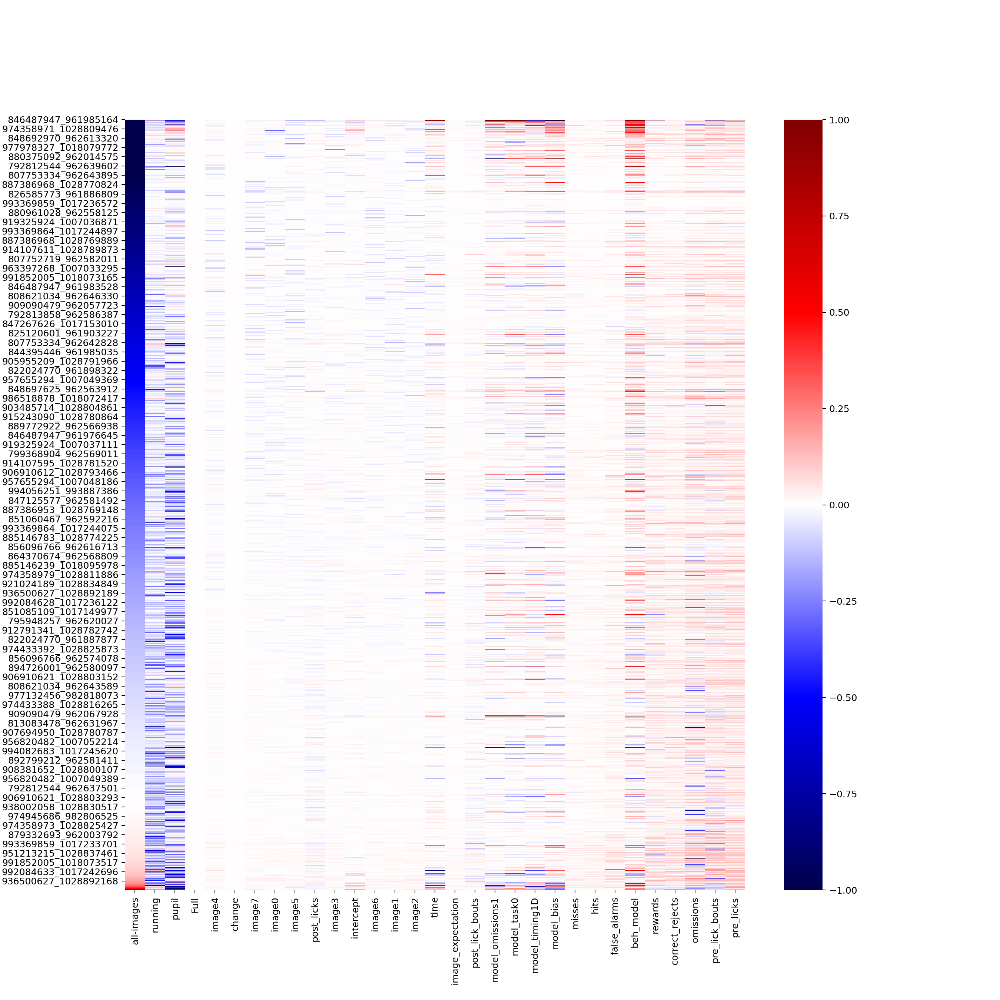

In [12]:
fig,ax=plt.subplots(figsize=(15,15))
sns.heatmap(
    rspm.set_index('identifier')[sorted_cols].sort_values(by=['all-images']),
    ax=ax,
    vmin=-1,
    vmax=1,
    cmap='seismic'
)

In [13]:
import umap

reducer_2d = umap.UMAP(n_components=2)
reducer_3d = umap.UMAP(n_components=3)

embedding_2d = reducer_2d.fit_transform(rspm[cols_for_clustering])
embedding_3d = reducer_3d.fit_transform(rspm[cols_for_clustering])
embedding_3d.shape

/home/dougo/.conda/envs/visual_behavior/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


(26795, 3)

In [14]:
rspm['umap_3d_embedding_0'] = embedding_3d[:, 0]
rspm['umap_3d_embedding_1'] = embedding_3d[:, 1]
rspm['umap_3d_embedding_2'] = embedding_3d[:, 2]

rspm['umap_2d_embedding_0'] = embedding_2d[:, 0]
rspm['umap_2d_embedding_1'] = embedding_2d[:, 1]

In [15]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=15)
umap_cols = ['umap_3d_embedding_0','umap_3d_embedding_1','umap_3d_embedding_2']
rspm['k_means_on_3d_umap'] = kmeans.fit_predict(rspm[umap_cols])
rspm['k_means_on_3d_umap'].value_counts()

0     2731
9     2507
6     2405
14    2369
3     2336
12    1963
2     1811
8     1602
7     1590
4     1583
5     1447
1     1357
13    1285
11    1082
10     727
Name: k_means_on_3d_umap, dtype: int64

<IPython.core.display.Javascript object>


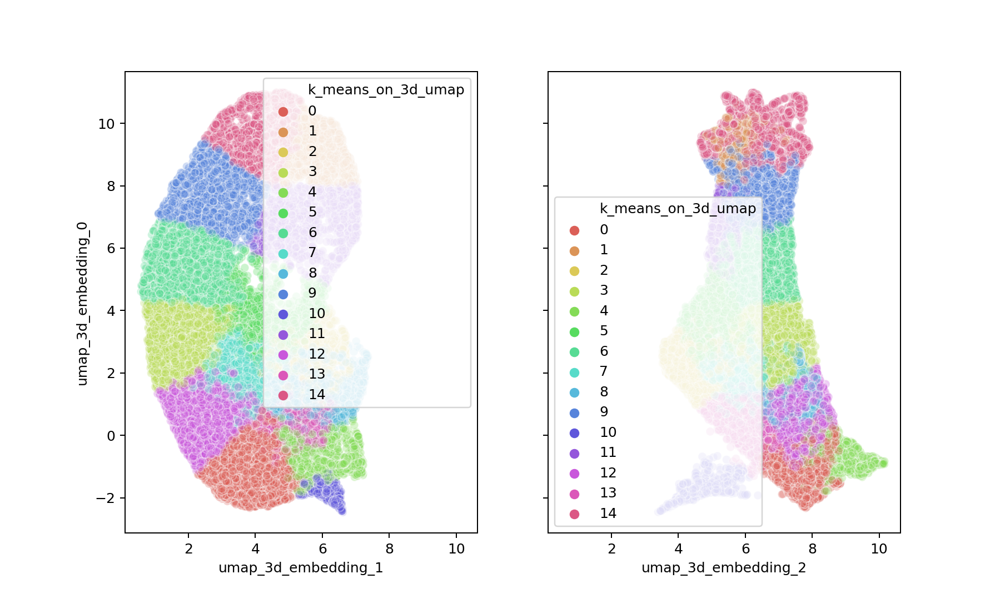

In [16]:
fig,ax=plt.subplots(1,2,figsize=(10,6),sharey=True,sharex=True)
sns.scatterplot(
    x='umap_3d_embedding_1', 
    y='umap_3d_embedding_0',
    hue='k_means_on_3d_umap',
    palette=sns.color_palette("hls", len(rspm['k_means_on_3d_umap'].unique())),
    data=rspm,
    legend='full',
    alpha=0.3,
    ax=ax[0],
)
sns.scatterplot(
    x='umap_3d_embedding_2', 
    y='umap_3d_embedding_0',
    hue='k_means_on_3d_umap',
    palette=sns.color_palette("hls", len(rspm['k_means_on_3d_umap'].unique())),
    data=rspm,
    legend='full',
    alpha=0.3,
    ax=ax[1],
)

In [17]:
import plotly.express as px
fig = px.scatter_3d(
    rspm, 
    x='umap_3d_embedding_0', 
    y='umap_3d_embedding_1', 
    z='umap_3d_embedding_2',
    color='k_means_on_3d_umap'
)
fig.update_layout(
    margin=dict(l=30, r=30, t=10, b=10),
    width=1200,
    height=1000,
)
fig.write_html("/home/dougo/code/dougollerenshaw.github.io/figures_to_share/2020.08.18_k_means_on_umap.html")
fig.show()

<IPython.core.display.Javascript object>


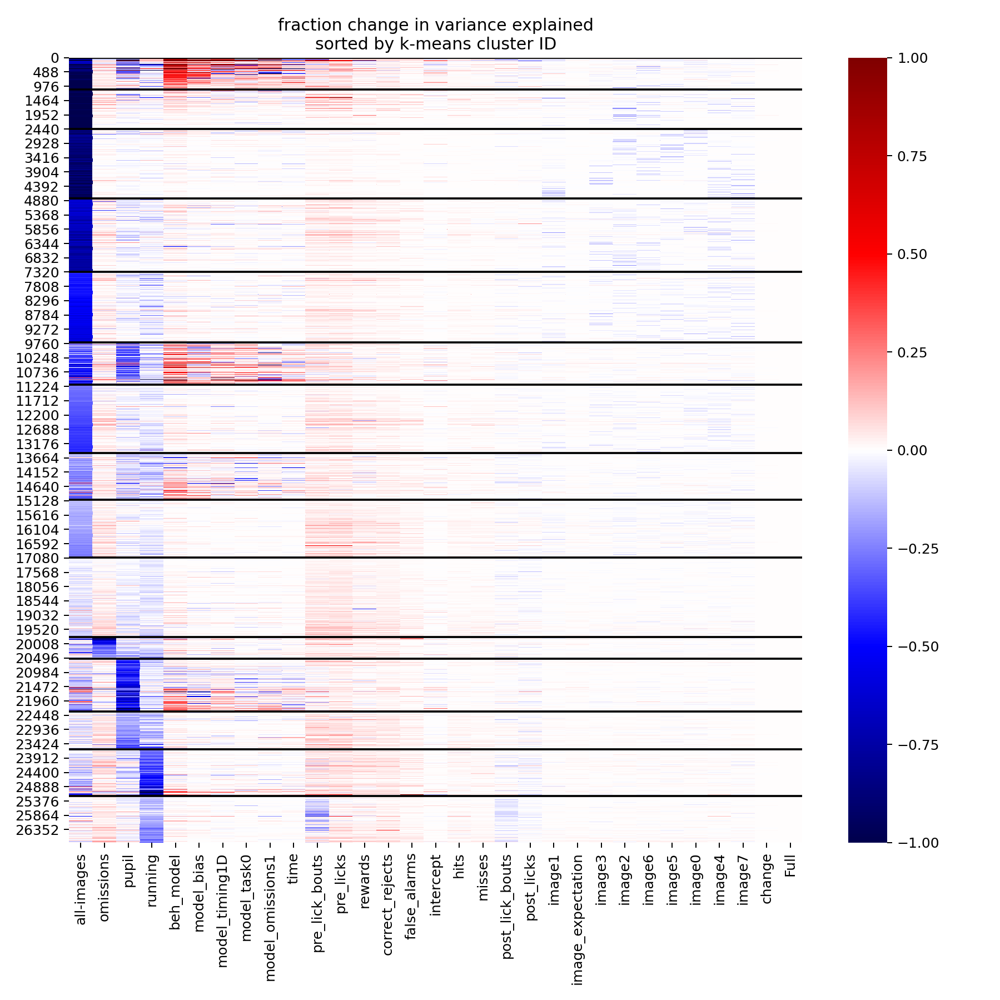

In [18]:
fig,ax=plt.subplots(figsize=(10,10))

umap_axes = ['umap_3d_embedding_0','umap_3d_embedding_1','umap_3d_embedding_2']
data = rspm[['k_means_on_3d_umap'] + umap_axes + list(cols_for_clustering)].sort_values(by=['k_means_on_3d_umap','umap_3d_embedding_0','umap_3d_embedding_1','umap_3d_embedding_2']).reset_index()
cluster_column_name = 'k_means_on_3d_umap'
for cluster_id in data[cluster_column_name].unique():
    data_subset = data.query("{} == {}".format(cluster_column_name, cluster_id))
    
    data.loc[data_subset.index,'dominant_dropout']=data_subset[cols_for_clustering].median(axis=0).idxmin()
    data.loc[data_subset.index,'dominant_dropout_median']=data_subset[cols_for_clustering].median(axis=0).min()
    


data_to_plot = (data
     .sort_values(by=['dominant_dropout','dominant_dropout_median','k_means_on_3d_umap','umap_3d_embedding_0','umap_3d_embedding_1','umap_3d_embedding_2'])
     .reset_index(drop=True)
    )

data_to_plot['cluster_transition'] = data_to_plot['k_means_on_3d_umap'] != data_to_plot['k_means_on_3d_umap'].shift()
for idx,row in data_to_plot.query('cluster_transition').iterrows():
    ax.axhline(idx,color='black')

sorted_cols = list(data_to_plot.query('cluster_transition')['dominant_dropout'].unique())
# cols_by_effect_size = list(data[cols_for_clustering].median(axis=0).abs().sort_values(ascending=False).index)
cols_by_effect_size = list(data[cols_for_clustering].quantile(0.99).abs().sort_values(ascending=False).index)

sorted_cols += [col for col in cols_by_effect_size if col not in sorted_cols]

sns.heatmap(
    data_to_plot.drop(columns=['index','k_means_on_3d_umap','dominant_dropout_median','dominant_dropout','cluster_transition']+umap_axes)[sorted_cols],
    ax=ax,
    vmin=-1,
    vmax=1,
    cmap='seismic'
)
ax.set_title('fraction change in variance explained\nsorted by k-means cluster ID')
fig.tight_layout()